# Diffusion Inversion Methods

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import lpips
from skimage.metrics import peak_signal_noise_ratio as psnr_metric
from skimage.metrics import structural_similarity as ssim_metric
from mlcbase import load_yaml
from inversions import INVERSION, pil2tensor

lpips_metric = lpips.LPIPS(net='alex')


👋 Welcome to use MuLingCloud. We aim to let everything easier.

📍 mlcbase (1.2.0a3) imported

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/home/wmchen/anaconda3/envs/diffusion-inversion/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/wmchen/anaconda3/envs/diffusion-inversion/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /home/wmchen/anaconda3/envs/diffusion-inversion/lib/python3.10/site-packages/lpips/weights/v0.1/alex.pth


## (ICLR'21) DDIM Inversion

In [2]:
ddim_result = INVERSION.build(load_yaml("configs/ddim.yaml"))
psnr_score = psnr_metric(np.array(ddim_result.ori_image), np.array(ddim_result.recon_image))
ssim_score = ssim_metric(np.array(ddim_result.ori_image), np.array(ddim_result.recon_image), win_size=11, channel_axis=2)
lpips_score = lpips_metric(pil2tensor(ddim_result.ori_image), pil2tensor(ddim_result.recon_image)).item()

/home/wmchen/anaconda3/envs/diffusion-inversion/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
denoise: 100%|██████████| 50/50 [00:03<00:00, 14.19it/s]


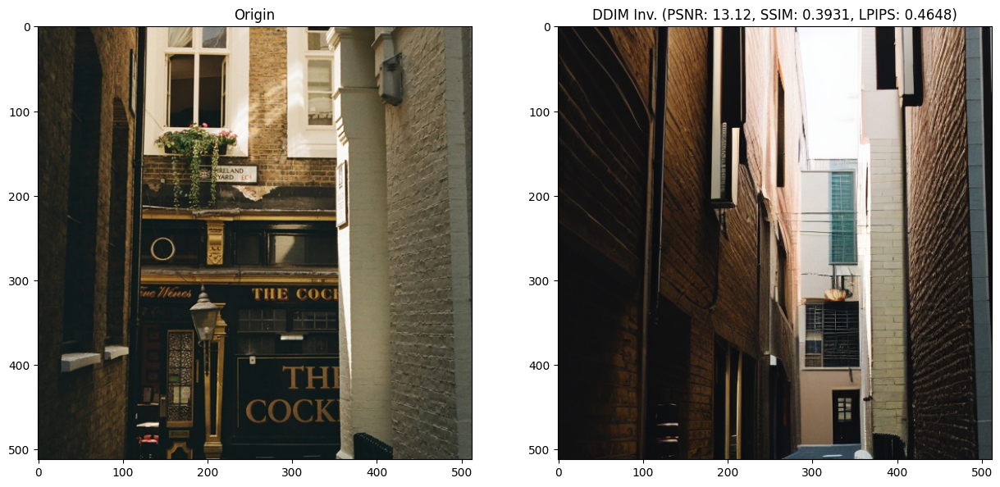

In [3]:
fig = plt.figure(figsize=(15, 10))
axs = fig.subplots(1, 2)
axs[0].set_title("Origin")
axs[0].imshow(np.array(ddim_result.ori_image))

axs[1].set_title(f"DDIM Inv. (PSNR: {psnr_score:.2f}, SSIM: {ssim_score:.4f}, LPIPS: {lpips_score:.4f})")
axs[1].imshow(np.array(ddim_result.recon_image))

plt.show()

## Negative Prompt Inversion

In [4]:
npi_result = INVERSION.build(load_yaml("configs/npi.yaml"))
psnr_score = psnr_metric(np.array(npi_result.ori_image), np.array(npi_result.recon_image))
ssim_score = ssim_metric(np.array(npi_result.ori_image), np.array(npi_result.recon_image), win_size=11, channel_axis=2)
lpips_score = lpips_metric(pil2tensor(npi_result.ori_image), pil2tensor(npi_result.recon_image)).item()

denoise: 100%|██████████| 50/50 [00:02<00:00, 24.09it/s]


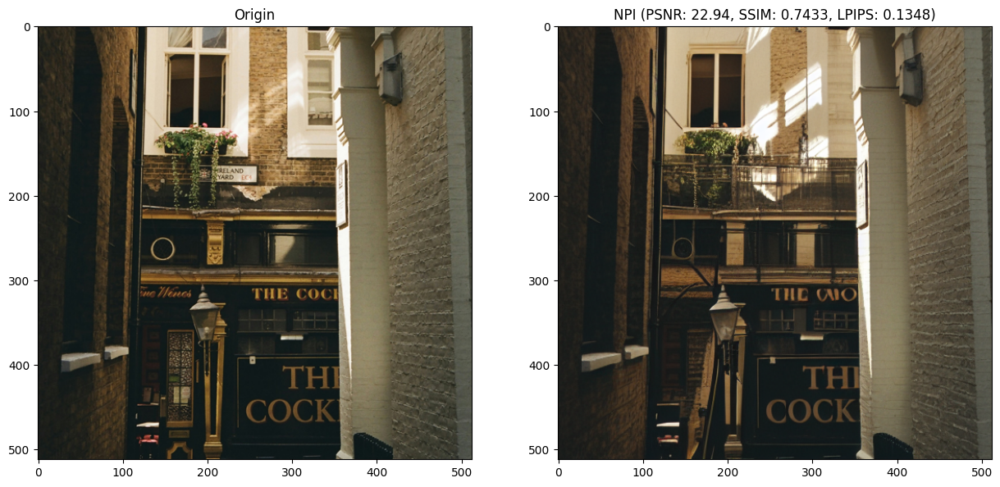

In [5]:
fig = plt.figure(figsize=(15, 10))
axs = fig.subplots(1, 2)
axs[0].set_title("Origin")
axs[0].imshow(np.array(npi_result.ori_image))

axs[1].set_title(f"NPI (PSNR: {psnr_score:.2f}, SSIM: {ssim_score:.4f}, LPIPS: {lpips_score:.4f})")
axs[1].imshow(np.array(npi_result.recon_image))

plt.show()

## (CVPR'23) Null-Text Inversion (NTI)

In [6]:
nti_result = INVERSION.build(load_yaml("configs/nti.yaml"))
psnr_score = psnr_metric(np.array(nti_result.ori_image), np.array(nti_result.recon_image))
ssim_score = ssim_metric(np.array(nti_result.ori_image), np.array(nti_result.recon_image), win_size=11, channel_axis=2)
lpips_score = lpips_metric(pil2tensor(nti_result.ori_image), pil2tensor(nti_result.recon_image)).item()

denosie: 100%|██████████| 50/50 [00:03<00:00, 14.31it/s]


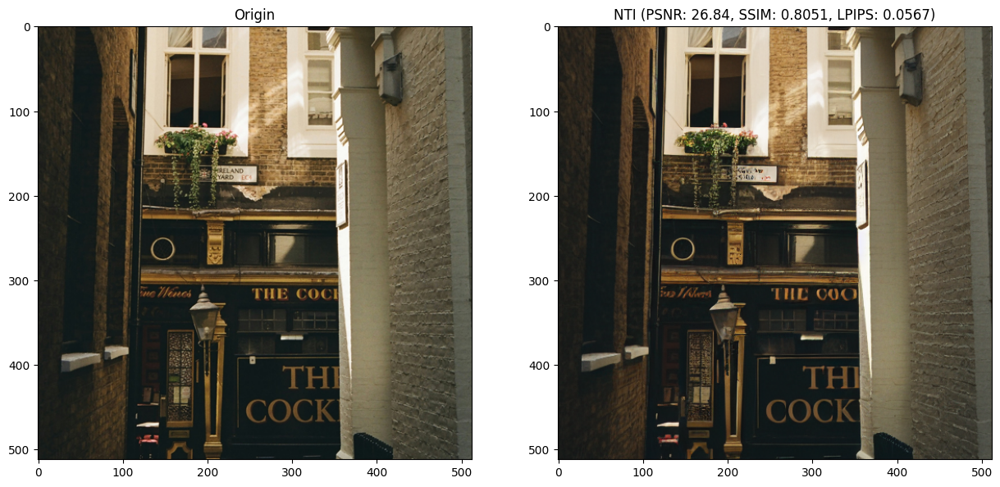

In [7]:
fig = plt.figure(figsize=(15, 10))
axs = fig.subplots(1, 2)
axs[0].set_title("Origin")
axs[0].imshow(np.array(nti_result.ori_image))

axs[1].set_title(f"NTI (PSNR: {psnr_score:.2f}, SSIM: {ssim_score:.4f}, LPIPS: {lpips_score:.4f})")
axs[1].imshow(np.array(nti_result.recon_image))

plt.show()

## (CVPR'23) Exact Diffusion Inversion via Coupled Transformations (EDICT)

In [8]:
edict_result = INVERSION.build(load_yaml("configs/edict.yaml"))
psnr_score_x = psnr_metric(np.array(edict_result.ori_image), np.array(edict_result.recon_image[0]))
ssim_score_x = ssim_metric(np.array(edict_result.ori_image), np.array(edict_result.recon_image[0]), win_size=11, channel_axis=2)
lpips_score_x = lpips_metric(pil2tensor(edict_result.ori_image), pil2tensor(edict_result.recon_image[0])).item()
psnr_score_y = psnr_metric(np.array(edict_result.ori_image), np.array(edict_result.recon_image[1]))
ssim_score_y = ssim_metric(np.array(edict_result.ori_image), np.array(edict_result.recon_image[1]), win_size=11, channel_axis=2)
lpips_score_y = lpips_metric(pil2tensor(edict_result.ori_image), pil2tensor(edict_result.recon_image[1])).item()

denoise: 100%|██████████| 50/50 [00:06<00:00,  7.17it/s]


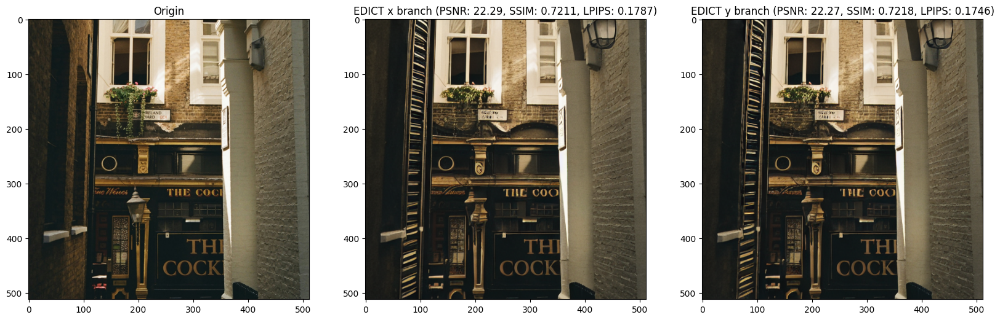

In [9]:
fig = plt.figure(figsize=(20, 10))
axs = fig.subplots(1, 3)
axs[0].set_title("Origin")
axs[0].imshow(np.array(edict_result.ori_image))

axs[1].set_title(f"EDICT x branch (PSNR: {psnr_score_x:.2f}, SSIM: {ssim_score_x:.4f}, LPIPS: {lpips_score_x:.4f})")
axs[1].imshow(np.array(edict_result.recon_image[0]))

axs[2].set_title(f"EDICT y branch (PSNR: {psnr_score_y:.2f}, SSIM: {ssim_score_y:.4f}, LPIPS: {lpips_score_y:.4f})")
axs[2].imshow(np.array(edict_result.recon_image[1]))


plt.show()

## Fixed-Point Inversion (FPI)

In [10]:
fpi_result = INVERSION.build(load_yaml("configs/fpi.yaml"))
psnr_score = psnr_metric(np.array(fpi_result.ori_image), np.array(fpi_result.recon_image))
ssim_score = ssim_metric(np.array(fpi_result.ori_image), np.array(fpi_result.recon_image), win_size=11, channel_axis=2)
lpips_score = lpips_metric(pil2tensor(fpi_result.ori_image), pil2tensor(fpi_result.recon_image)).item()

denoise: 100%|██████████| 50/50 [00:03<00:00, 14.51it/s]


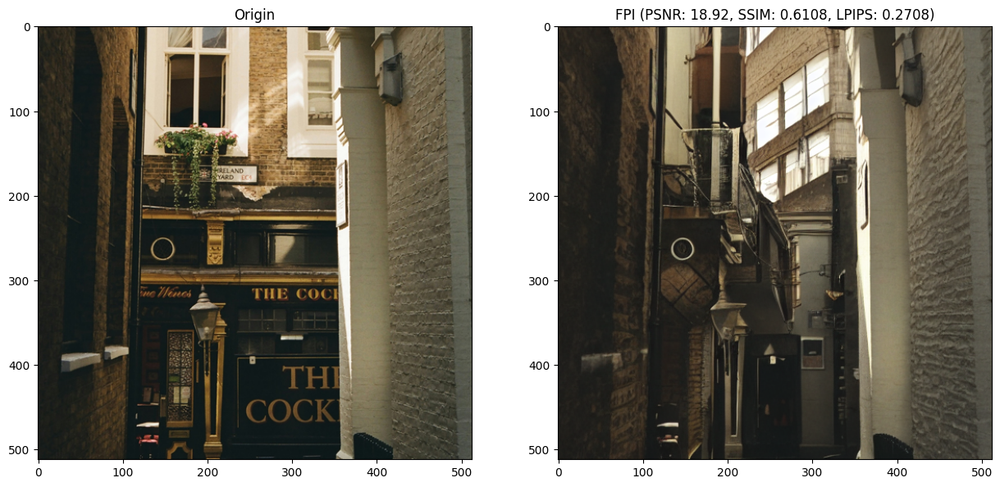

In [11]:
fig = plt.figure(figsize=(15, 10))
axs = fig.subplots(1, 2)
axs[0].set_title("Origin")
axs[0].imshow(np.array(fpi_result.ori_image))

axs[1].set_title(f"FPI (PSNR: {psnr_score:.2f}, SSIM: {ssim_score:.4f}, LPIPS: {lpips_score:.4f})")
axs[1].imshow(np.array(fpi_result.recon_image))

plt.show()

## (ICCV'23) Accelerated Iterative Diffusion Inversion (AIDI)

In [12]:
aidi_a_result = INVERSION.build(load_yaml("configs/aidi_a.yaml"))
psnr_score_a = psnr_metric(np.array(aidi_a_result.ori_image), np.array(aidi_a_result.recon_image))
ssim_score_a = ssim_metric(np.array(aidi_a_result.ori_image), np.array(aidi_a_result.recon_image), win_size=11, channel_axis=2)
lpips_score_a = lpips_metric(pil2tensor(aidi_a_result.ori_image), pil2tensor(aidi_a_result.recon_image)).item()

denoise: 100%|██████████| 50/50 [00:02<00:00, 24.09it/s]


In [13]:
aidi_e_result = INVERSION.build(load_yaml("configs/aidi_e.yaml"))
psnr_score_e = psnr_metric(np.array(aidi_e_result.ori_image), np.array(aidi_e_result.recon_image))
ssim_score_e = ssim_metric(np.array(aidi_e_result.ori_image), np.array(aidi_e_result.recon_image), win_size=11, channel_axis=2)
lpips_score_e = lpips_metric(pil2tensor(aidi_e_result.ori_image), pil2tensor(aidi_e_result.recon_image)).item()

denoise: 100%|██████████| 50/50 [00:02<00:00, 24.55it/s]


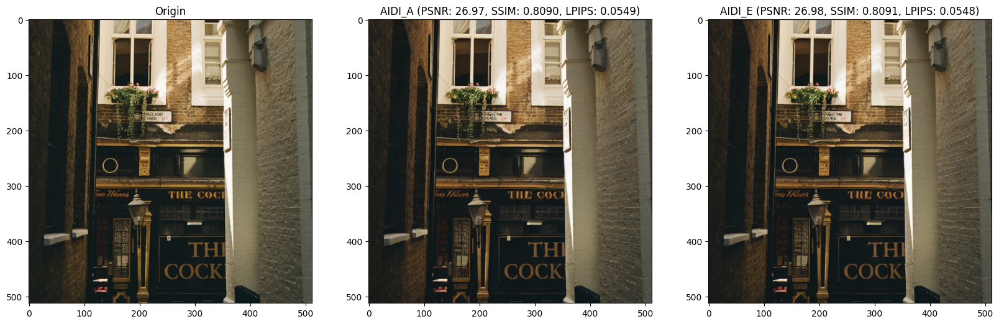

In [14]:
fig = plt.figure(figsize=(20, 10))
axs = fig.subplots(1, 3)
axs[0].set_title("Origin")
axs[0].imshow(np.array(aidi_a_result.ori_image))

axs[1].set_title(f"AIDI_A (PSNR: {psnr_score_a:.2f}, SSIM: {ssim_score_a:.4f}, LPIPS: {lpips_score_a:.4f})")
axs[1].imshow(np.array(aidi_a_result.recon_image))

axs[2].set_title(f"AIDI_E (PSNR: {psnr_score_e:.2f}, SSIM: {ssim_score_e:.4f}, LPIPS: {lpips_score_e:.4f})")
axs[2].imshow(np.array(aidi_e_result.recon_image))


plt.show()

## (ICCV'23) Prompt Tuning Inversion (PTI)

In [15]:
pti_result = INVERSION.build(load_yaml("configs/pti.yaml"))
psnr_score = psnr_metric(np.array(pti_result.ori_image), np.array(pti_result.recon_image))
ssim_score = ssim_metric(np.array(pti_result.ori_image), np.array(pti_result.recon_image), win_size=11, channel_axis=2)
lpips_score = lpips_metric(pil2tensor(pti_result.ori_image), pil2tensor(pti_result.recon_image)).item()

denosie: 100%|██████████| 50/50 [00:03<00:00, 14.04it/s]


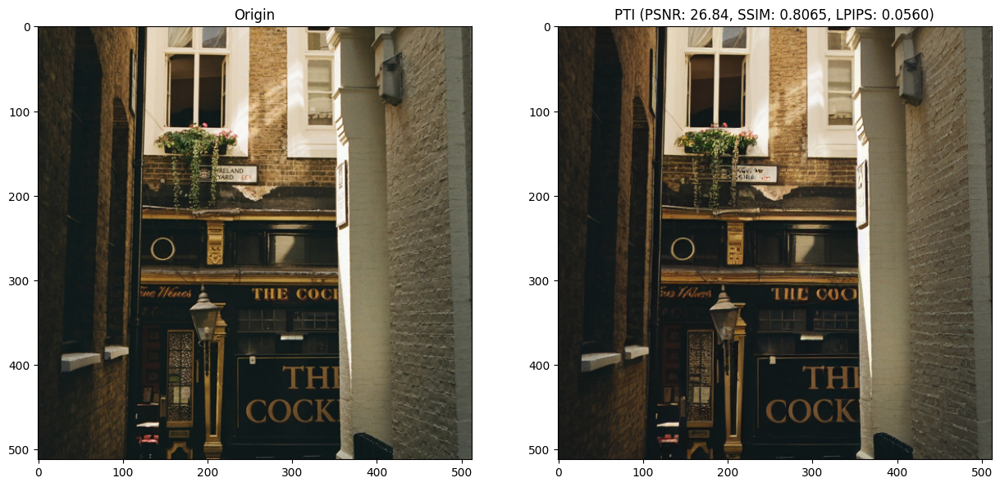

In [16]:
fig = plt.figure(figsize=(15, 10))
axs = fig.subplots(1, 2)
axs[0].set_title("Origin")
axs[0].imshow(np.array(pti_result.ori_image))

axs[1].set_title(f"PTI (PSNR: {psnr_score:.2f}, SSIM: {ssim_score:.4f}, LPIPS: {lpips_score:.4f})")
axs[1].imshow(np.array(pti_result.recon_image))

plt.show()

## (AAAI'24) Tuning-free Inversion-enhanced Control (TIC)

In [17]:
tic_result = INVERSION.build(load_yaml("configs/tic.yaml"))
psnr_score = psnr_metric(np.array(tic_result.ori_image), np.array(tic_result.recon_image))
ssim_score = ssim_metric(np.array(tic_result.ori_image), np.array(tic_result.recon_image), win_size=11, channel_axis=2)
lpips_score = lpips_metric(pil2tensor(tic_result.ori_image), pil2tensor(tic_result.recon_image)).item()

denoise: 100%|██████████| 50/50 [00:02<00:00, 23.84it/s]


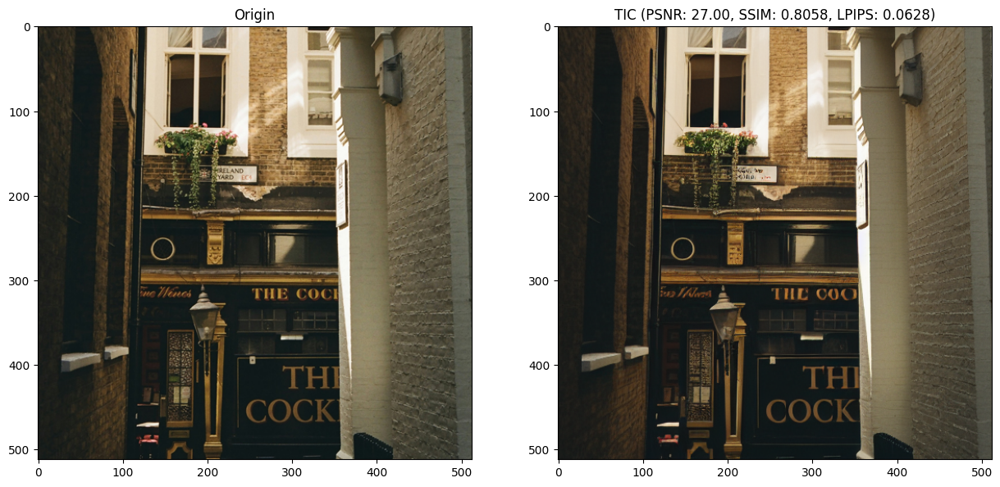

In [18]:
fig = plt.figure(figsize=(15, 10))
axs = fig.subplots(1, 2)
axs[0].set_title("Origin")
axs[0].imshow(np.array(tic_result.ori_image))

axs[1].set_title(f"TIC (PSNR: {psnr_score:.2f}, SSIM: {ssim_score:.4f}, LPIPS: {lpips_score:.4f})")
axs[1].imshow(np.array(tic_result.recon_image))

plt.show()